Le comptage d'arbres sur l'imagerie peut s'avérer très important selon les contextes. Dans le domaine agricole par exemple, il peut server à faire l'inventaire des arbres d'une exploitation et de suivre leur dynamique au cours du temps. De plus, cela peut servir dans des études assez poussées où cherchera à extraire certaines caractéristiques relatives aux arbres pour des fins de modélisation. Dans ce notebook, nous allons explorer le modèle `YOLOv10s` pour la détection des palmiers sur les images drones. Le jeu de données à utiliser est issu de kaggle et est intitulé [Aerial images of palm trees](https://www.kaggle.com/datasets/riotulab/aerial-images-of-palm-trees)

## Installation de la bibliothèque `ultralytics`

In [1]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.3/41.3 kB 1.5 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.

In [17]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Import de bibliothèques

In [2]:
import os, glob
from pathlib import Path
from PIL import Image, ImageDraw, ImageFont
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from xml.etree import ElementTree as ET
from skimage import io
import shutil
from sklearn.metrics import mean_absolute_error

## Telechargement des données sur Kaggle

Les données sont issues de Kaggle à travers ce [lien](https://www.kaggle.com/datasets/riotulab/aerial-images-of-palm-trees)

In [3]:
!kaggle datasets download -d riotulab/aerial-images-of-palm-trees

Dataset URL: https://www.kaggle.com/datasets/riotulab/aerial-images-of-palm-trees
License(s): unknown
100% 780M/780M [00:45<00:00, 19.3MB/s]
100% 780M/780M [00:45<00:00, 17.9MB/s]


In [4]:
import zipfile
zip_ref = zipfile.ZipFile('/content/aerial-images-of-palm-trees.zip', 'r')
zip_ref.extractall('/content')
zip_ref.close()

## Inspection et organisation des données

In [5]:
# Création des dossiers
base_data_folder = "/content/trees_data"
Path(base_data_folder).mkdir(parents=True, exist_ok=True)

Path(base_data_folder + "/train").mkdir(parents=True, exist_ok=True)
Path(base_data_folder + "/train/images").mkdir(parents=True, exist_ok=True)
Path(base_data_folder + "/train/labels").mkdir(parents=True, exist_ok=True)
Path(base_data_folder + "/valid").mkdir(parents=True, exist_ok=True)
Path(base_data_folder + "/valid/images").mkdir(parents=True, exist_ok=True)
Path(base_data_folder + "/valid/labels").mkdir(parents=True, exist_ok=True)

In [6]:
import pandas as pd
a = pd.read_csv("/content/Palm-Counting-349images/test_labels.csv")

In [7]:
a["class"].unique()

array(['Tree', 'Palm'], dtype=object)

In [8]:

def get_img_bboxes_from_df(dataframe, img_name, labels_mapping):
  """
    Récupérer la liste des boites et leur classes
    à partir du dataframe de pandas

    dataframe : dataframe de pandas
    img_name : nom de l'image
    labels_mapping : dictionnaire des classes : {'Palm': 0, 'Tree': 1}

    return:
    bboxes : liste des boites et leur classes -> [(class_id, x_center, y_center, width, height)]
  """
  df_img = dataframe[dataframe["filename"] == img_name]
  width = df_img.xmax - df_img.xmin
  height = df_img.ymax - df_img.ymin
  x_center = (df_img.xmin + df_img.xmax)/2
  y_center = (df_img.ymin + df_img.ymax) / 2
  classes = df_img["class"].map(lambda x: labels_mapping[x])

  x_center_norm = x_center / df_img.width
  y_center_norm = y_center / df_img.height
  width_norm = width / df_img.width
  height_norm = height / df_img.height

  bboxes = list(zip(classes, x_center_norm, y_center_norm, width_norm, height_norm))

  return bboxes

In [9]:
def create_and_save_annotations(csv_annotations, labels_endoding, save_path):
  """
    Créer les annotations de YOLOv8
  """
  df = pd.read_csv(csv_annotations)
  image_names = df.filename.unique().tolist()
  # Pour chaque image :
  for image_name in image_names:
    # Récupérer les labels [(class, xc, yc, width, height), ...]
    labels = get_img_bboxes_from_df(dataframe=df, img_name=image_name, labels_mapping=labels_endoding)

    # Sauvegarder les annotations dans un fichier .txt
    f_path = os.path.join(save_path, image_name.split(".")[0] + ".txt")
    with open(f_path, "w+") as f:
      # for bbox in labels:
      #  f.write(f"{bbox[0]} {bbox[1]} {bbox[2]} {bbox[3]} {bbox[4]}\n")
      labels = [f"{label[0]} {label[1]} {label[2]} {label[3]} {label[4]}\n" for label in labels]
      f.writelines(labels)

  return image_names


def copy_images(src_folder, images_names, save_path):
  """

  """
  for image in images_names:
    shutil.copy(os.path.join(src_folder, image), save_path)


def create_data(csv_annotations, labels_mapping, images_folder, save_folder):
  """
    Créer les annotations de YOLOv8 et copie les images
  """
  nom_images = create_and_save_annotations(csv_annotations, labels_mapping, save_path=save_folder + "/labels")
  copy_images(src_folder=images_folder, images_names=nom_images, save_path=save_folder + "/images")

In [10]:
# Classes : Palm and Tree
labels_endoding = {
    "Palm": 0,
    "Tree": 1
}
csv_annotations = ["/content/Palm-Counting-349images/test_labels.csv", "/content/Palm-Counting-349images/train_labels.csv"]
images_folders = ["""/content/Palm-Counting-349images/test""", "/content/Palm-Counting-349images/train"]
save_base_folders = ["/content/trees_data/valid", "/content/trees_data/train"]

for annotation_file, images_folder, save_folder in zip(csv_annotations, images_folders, save_base_folders):
  create_data(annotation_file, labels_endoding, images_folder, save_folder)

## Visualisation d'images et annotations

In [11]:
# Télécharger le style de texte arial
!wget https://font.download/dl/font/arial.zip

import zipfile
zip_ref = zipfile.ZipFile('/content/arial.zip', 'r')
Path('/content/arial').mkdir(parents=True, exist_ok=True)
zip_ref.extractall('/content/arial')
zip_ref.close()

--2024-08-05 10:31:39--  https://font.download/dl/font/arial.zip
Resolving font.download (font.download)... 172.67.140.4, 104.21.46.145, 2606:4700:3031::6815:2e91, ...
Connecting to font.download (font.download)|172.67.140.4|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3834335 (3.7M) [application/zip]
Saving to: ‘arial.zip’

arial.zip           100%[===================>]   3.66M  --.-KB/s    in 0.06s   

2024-08-05 10:31:39 (58.2 MB/s) - ‘arial.zip’ saved [3834335/3834335]



In [12]:
def get_img_annotations(img_path):
  label_path = img_path.replace(".jpg", ".txt").replace("images", "labels")
  assert Path(label_path).exists(), f"Label path {label_path} does not exist"
  height_img, width_img, _ = io.imread(img_path).shape
  tree_annotations = []
  with open(label_path) as f:
    for line in f.readlines():
      class_id, x_center, y_center, width, height = line.split(" ")
      x_center = float(x_center) * width_img
      y_center = float(y_center) * height_img
      width = float(width) * width_img
      height = float(height) * height_img

      x1 = x_center - width/2
      y1 = y_center - height/2
      x2 = x_center + width/2
      y2 = y_center + height/2
      tree_annotations.append((class_id, int(x1), int(y1), int(x2), int(y2)))
  return tree_annotations

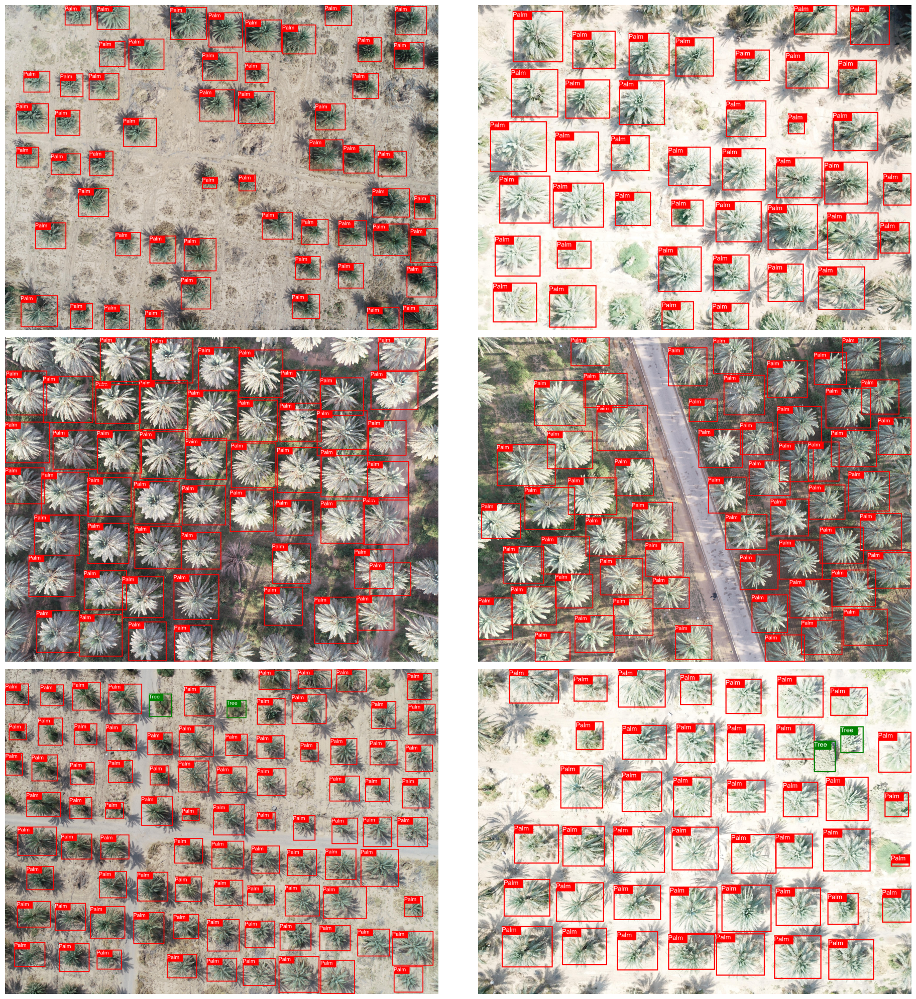

In [13]:
n_images = 6
images = glob.glob("/content/trees_data/train/images/*.jpg")[:n_images]
fig, axs = plt.subplots(3, 2, figsize=(20, 20))
for img_path, ax in zip(images, axs.flatten()):
  img_pil = Image.open(img_path)
  annotations = get_img_annotations(img_path=img_path)
  for annotation in annotations:
    texte = "Palm" if int(annotation[0]) == 0 else "Tree"
    color = "red" if int(annotation[0]) == 0 else "green"

    font = ImageFont.truetype("/content/arial/ARIAL.TTF", 60)
    x1, y1, x2, y2 = font.getbbox(texte, anchor="ms")
    h = y2 - y1
    w = x2 - x1

    x_1, y_1, x_2, y_2 = annotation[1:]

    y1 = y_1
    x1 = x_1
    x2 = x_1 + w + 20
    y2 = y_1 + h + 20

    if y_1 - h < 0:
      y2 = y_1 + h



    text_anchor = [x1, y1, x2+20, y2+20]
    bbox = [x_1, y_1, x_2, y_2]


    ImageDraw.Draw(img_pil).rectangle(bbox, outline=color, width=10)
    ImageDraw.Draw(img_pil).rectangle(text_anchor, outline=color, fill=color, width=10)
    ImageDraw.Draw(img_pil).text(text_anchor, texte, fill="white", font=font)

  ax.imshow(np.asarray(img_pil))
  ax.axis("off")

fig.tight_layout()

## Configuration et entrainement du modèle YOLOv8

Créer le fichier `data.yaml` dans le repertoire `/content/trees_data` et y ajouter le contenu

```
names:
- Palm
- Tree
nc: 2
train: /content/trees_data/train/images
val: /content/trees_data/valid/images
```

Palm : 0 et Tree : 1


In [14]:
content = """
names:
- Palm
- Tree
nc: 2
train: /content/trees_data/train/images
val: /content/trees_data/valid/images"""

with open("/content/trees_data/data.yaml", "w+") as f:
  f.write(content)

In [15]:
from ultralytics import YOLO
import pandas as pd

In [16]:
data = "/content/trees_data/data.yaml"
save_path = "/content/drive/MyDrive/DeepLearningForEO-UdemyTraining/PalmTreeDetection"
name = "yolov10sTrain1"

In [ ]:

model_ckpt = "yolov10s.pt"
resume = True
epochs = 500

if resume:
  model_ckpt = os.path.join(save_path, name, "weights", "last.pt")
  epochs_lasted = pd.read_csv(os.path.join(save_path, name, "results.csv")).shape[0]
  epochs = epochs - epochs_lasted

model  = YOLO(model_ckpt)

results = model.train(data=data, epochs=epochs, project=save_path, resume=resume,  name=name, patience=100, optimizer="Adam", batch=8)


In [19]:
# Validation du modèle
ckpt = os.path.join(save_path, name, "weights", "best.pt")
val_results = YOLO(ckpt).val(
        data=data, split="val",
        conf=0.3,
        iou=0.7,
        # imgsz=int(size),
        max_det=1000,
        verbose=False
        )

Ultralytics YOLOv8.2.73 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv10s summary (fused): 293 layers, 8,036,508 parameters, 0 gradients, 24.4 GFLOPs


100%|██████████| 755k/755k [00:00<00:00, 118MB/s]
val: Scanning /content/trees_data/valid/labels... 70 images, 0 backgrounds, 0 corrupt: 100%|██████████| 70/70 [00:00<00:00, 1764.93it/s]

val: New cache created: /content/trees_data/valid/labels.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:23<00:00,  4.70s/it]


                   all         70       2670      0.797      0.765      0.816      0.501
Speed: 8.4ms preprocess, 53.7ms inference, 0.0ms loss, 3.3ms postprocess per image
Results saved to runs/detect/val


## Evaluation de la corrélation de comptage des arbres sur les images

In [20]:
ckpt = os.path.join(save_path, name, "weights", "best.pt")
predictions = YOLO(ckpt).predict(source="/content/trees_data/valid/images", save=True, save_txt=True, verbose=False)

Results saved to runs/detect/predict
70 labels saved to runs/detect/predict/labels


In [21]:
def get_annotations_stats(label_path, labels_endoding={0 : 'Palm', 1 : 'Tree'}):
  """
    Retourne le nombre d'occurance par classe de l'image
    img_path : chemin de l'annotation
    labels_endoding : dictionnaire des classes : {0 : 'Palm', 1 : 'Tree'}
  """
  assert Path(label_path).exists(), f"Label path {label_path} does not exist"

  classes_freq = dict()
  # Initialisation à 0
  for classe in list(labels_endoding.values()):
    classes_freq[classe] = 0

  with open(label_path) as f:
    for line in f.readlines():
      class_id, _, _, _, _ = line.split(" ")
      class_id = int(class_id)
      classes_freq[labels_endoding[class_id]] += 1

  return classes_freq


In [22]:
pred_labels_paths = sorted(glob.glob("/content/runs/detect/predict/labels/*.txt"))
true_labels_paths = sorted(glob.glob("/content/trees_data/valid/labels/*.txt"))


In [23]:
data = {
    "true_palm" : [],
    "pred_palm" : [],
    "true_number": [],
    "pred_number": [],
    "true_tree" : [],
    "pred_tree" : []
}
for pred_label_path, true_label_path in zip(pred_labels_paths, true_labels_paths):
  pred_classes_stats = get_annotations_stats(label_path=pred_label_path)
  true_classes_stats = get_annotations_stats(label_path=true_label_path)

  true_palm = true_classes_stats["Palm"]
  pred_palm = pred_classes_stats["Palm"]
  true_tree = true_classes_stats["Tree"]
  pred_tree = pred_classes_stats["Tree"]

  data["true_palm"].append(true_palm)
  data["pred_palm"].append(pred_palm)
  data["true_tree"].append(true_tree)
  data["pred_tree"].append(pred_tree)
  data["true_number"].append(true_palm + true_tree)
  data["pred_number"].append(pred_palm + pred_tree)

In [24]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [25]:
df = pd.DataFrame(data)
df.head()

,true_palm,pred_palm,true_number,pred_number,true_tree,pred_tree
0,46,56,78,85,32,29
1,90,111,90,111,0,0
2,89,105,92,107,3,2
3,78,91,92,102,14,11
4,69,77,71,80,2,3


Text(0, 0.5, "Nombre d'arbres prédits")

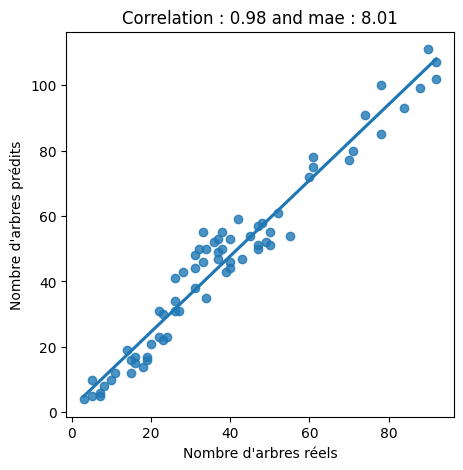

In [26]:
fit, ax = plt.subplots(figsize=(5, 5))
correlation = "{:.2f}".format(float(df["true_number"].corr(df["pred_number"])))
sns.regplot(data=df, x="true_number", y="pred_number", ci=None, ax=ax)
mae = mean_absolute_error(df["true_number"], df["pred_number"])
ax.set_title(f"Correlation : {correlation} and mae : {mae:.2f}")
ax.set_xlabel("Nombre d'arbres réels")
ax.set_ylabel("Nombre d'arbres prédits")

Le modèle permet de compter les arbres avec une corrélation de 98%. L'on pourrait améliorer la performance en tuillant l'image.
